# MA0218 Mini Project
## Topic: Aviation Accident Database & Synopses
### Concorde Team

Name: <br/>
Pisutsin Phumrapee <br/>
Lai En Han <br/>
Nanayakkara Kavishni Nethara Pallege <br/>
Eng Xin Fang <br/>


This notebook is also shared at the link below (in case the notebook cannot be viewed properly here):

https://colab.research.google.com/drive/1PGda79KIynUULjZCVO2F3aSsM_roAHEl?usp=sharing

Import necessary libraries & Initial set-ups

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly
sns.set()

Import the aviation dataset

In [ ]:
df = pd.read_csv("https://docs.google.com/spreadsheets/d/e/2PACX-1vR6l8YE3yCNa7ed8AFhehtun7NzAHy2kptyh7P83qTr_R0Yj6KLfj3Qsdqb01cXhU-Sc-05KrkPk5Qj/pub?gid=1247764833&single=true&output=csv")
df.head()

,Event.Id,Investigation.Type,Accident.Number,Event.Date,Location,Country,Latitude,Longitude,Airport.Code,Airport.Name,Injury.Severity,Aircraft.Damage,Aircraft.Category,Registration.Number,Make,Model,Amateur.Built,Number.of.Engines,Engine.Type,FAR.Description,Schedule,Purpose.of.Flight,Air.Carrier,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.Phase.of.Flight,Report.Status,Publication.Date
0,20200102X82407,Accident,WPR20CA055,12/31/2019,"Elk, CA",United States,39.128611,-123.715833,LLR,Little River,Non-Fatal,Substantial,Airplane,N7095M,Cessna,175,No,1.0,Reciprocating,Part 91: General Aviation,NaN,Personal,NaN,NaN,NaN,NaN,1.0,VMC,TAKEOFF,Factual,13/01/2020
1,20191231X83852,Accident,CEN20FA049,12/31/2019,"OLATHE, KS",United States,38.846111,-94.736111,OJC,Johnson County Executive,Fatal(2),Destroyed,Airplane,N602TF,Mooney,M20S,No,1.0,Reciprocating,Part 91: General Aviation,NaN,Personal,NaN,2.0,NaN,NaN,NaN,VMC,TAKEOFF,Preliminary,8/1/2020
2,20200102X54844,Accident,ANC20CA011,12/31/2019,"Fairbanks, AK",United States,64.666945,-148.133334,NaN,NaN,Non-Fatal,Substantial,Airplane,N4667C,Cessna,170,No,1.0,NaN,Part 91: General Aviation,NaN,Personal,NaN,NaN,NaN,NaN,2.0,NaN,NaN,Preliminary,2/1/2020
3,20191230X91852,Accident,CEN20CA048,12/30/2019,"GRANBURY, TX",United States,32.365556,-97.645000,NaN,NaN,Non-Fatal,Substantial,Airplane,N519RV,Vans,RV 10,Yes,NaN,NaN,Part 91: General Aviation,NaN,Personal,NaN,NaN,NaN,NaN,1.0,NaN,NaN,Preliminary,31/12/2019
4,20191228X62945,NaN,WPR20CA053,12/28/2019,"Missoula, MT",United States,NaN,NaN,MSO,NaN,Unavailable,Substantial,NaN,N4476B,Cessna,170,No,1.0,NaN,Public Aircraft,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Preliminary,3/1/2020


Plot of number of aviation accident from 1982 to 2019

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



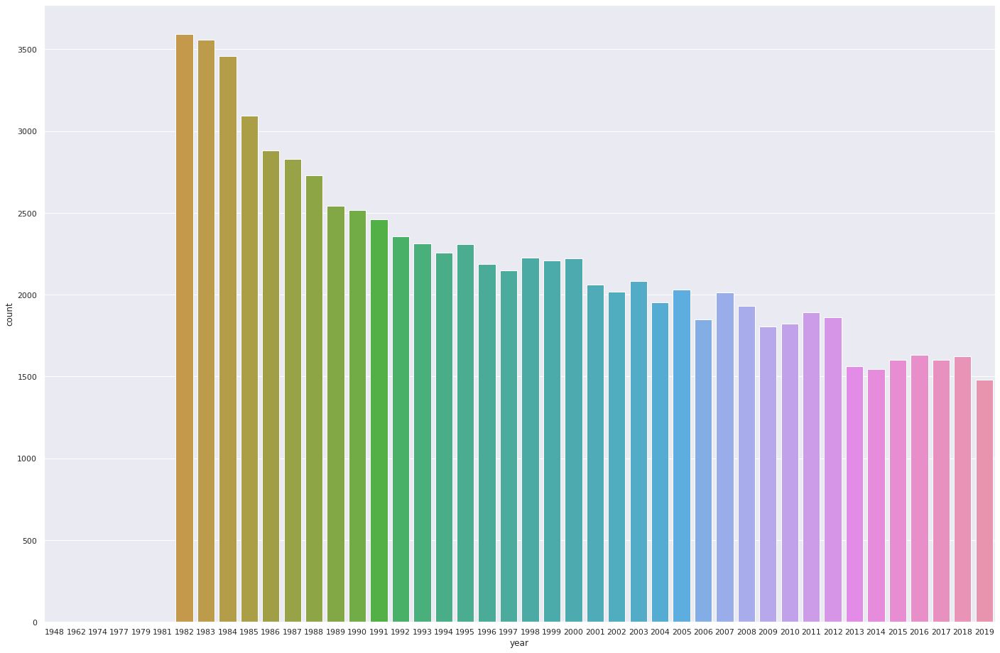

In [ ]:
df["day"], df["month"], df["year"] = zip(*df['Event.Date'].map(lambda x: str(x).split('/')))

df["day"] = df["day"].astype(int)
df["month"] = df["month"].astype(int)
df["year"] = df["year"].astype(int)

f, axes = plt.subplots(1, 1, figsize=(24,16))
sns.countplot(df["year"])

We can see the trend to decrease in terms of the number of aviation accidents throughout the years

KDE Plot of the previous chart

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



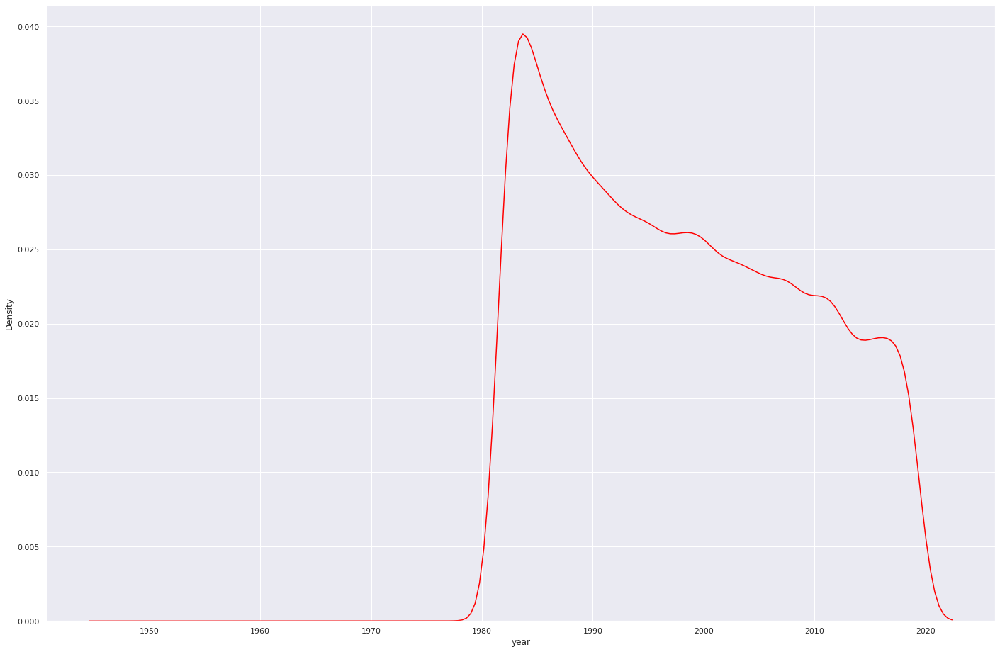

In [ ]:
f, axes = plt.subplots(1, 1, figsize=(24, 16))
sns.distplot(df["year"], hist = False, color = "red")

The number of fatality caused by aviation accidents yearly.

In [ ]:
#Total.Fatal.Injuries
import re
import numpy as np
fatal_counts = []
fatal_bools = []

for i in range(len(df)):
    fatal_resp = df.iloc[i]['Injury.Severity']
    if str(fatal_resp) == 'Non-Fatal':
        fatal_counts.append(0)
        fatal_bools.append("None")
    elif fatal_resp is not None:
        num = re.sub(r'\D', "", str(fatal_resp))
        if num == "":
            fatal_counts.append(np.nan)
            fatal_bools.append("Unknown")
        else:
            fatal_counts.append(int(num))
            fatal_bools.append("Fatal")
    else:
        fatal_counts.append(np.nan)
        fatal_bools.append("Unknown")
    
df['Fatal_Counts'] = fatal_counts
df['Fatal_Bool'] = fatal_bools

In [ ]:
fatality_every_year = df[df["Fatal_Bool"] == "Fatal"]
fatality_every_year.head()

,Event.Id,Investigation.Type,Accident.Number,Event.Date,Location,Country,Latitude,Longitude,Airport.Code,Airport.Name,Injury.Severity,Aircraft.Damage,Aircraft.Category,Registration.Number,Make,Model,Amateur.Built,Number.of.Engines,Engine.Type,FAR.Description,Schedule,Purpose.of.Flight,Air.Carrier,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.Phase.of.Flight,Report.Status,Publication.Date,day,month,year,Fatal_Counts,Fatal_Bool
1,20191231X83852,Accident,CEN20FA049,12/31/2019,"OLATHE, KS",United States,38.846111,-94.736111,OJC,Johnson County Executive,Fatal(2),Destroyed,Airplane,N602TF,Mooney,M20S,No,1.0,Reciprocating,Part 91: General Aviation,NaN,Personal,NaN,2.0,NaN,NaN,NaN,VMC,TAKEOFF,Preliminary,8/1/2020,12,31,2019,2.0,Fatal
5,20191228X23853,Accident,CEN20MA044,12/28/2019,"LAFAYETTE, LA",United States,30.176111,-92.007500,LFT,Lafayette Regional Apt,Fatal(5),Destroyed,Airplane,N42CV,Piper,PA 31T,No,2.0,Turbo Prop,Part 91: General Aviation,NaN,Executive/Corporate,NaN,5.0,2.0,2.0,NaN,IMC,TAKEOFF,Preliminary,6/1/2020,12,28,2019,5.0,Fatal
6,20191225X93635,Accident,ERA20FA056,12/25/2019,"Headland, AL",United States,31.364167,-85.312500,0J6,Headland Municipal,Fatal(1),Substantial,Helicopter,N663SF,Bell,407,No,1.0,Turbo Shaft,Part 135: Air Taxi & Commuter,NSCH,NaN,"Viking Aviation, LLC (DBA: Survival Flight, LLC)",1.0,NaN,NaN,2.0,VMC,APPROACH,Preliminary,6/1/2020,12,25,2019,1.0,Fatal
10,20191221X83621,Accident,CEN20FA038,12/21/2019,"Evansville, IN",United States,38.095833,-87.540555,EVV,Evansville Rgnl,Fatal(1),Destroyed,Airplane,N601FL,Piper,PA28,No,1.0,Reciprocating,Part 91: General Aviation,NaN,Personal,NaN,1.0,NaN,NaN,NaN,NaN,APPROACH,Preliminary,6/1/2020,12,21,2019,1.0,Fatal
23,20191210X03219,Accident,CEN20FA032,12/9/2019,"Victoria, TX",United States,28.852500,-96.918611,NaN,NaN,Fatal(1),Destroyed,Airplane,N4602B,Cessna,208,No,1.0,Turbo Prop,Part 135: Air Taxi & Commuter,NSCH,NaN,Martinaire Aviation,1.0,NaN,NaN,NaN,VMC,TAKEOFF,Preliminary,6/1/2020,12,9,2019,1.0,Fatal


In [ ]:
fatality_every_year = fatality_every_year[["year", "Fatal_Counts"]]
fatality_every_year=fatality_every_year.groupby("year").sum().reset_index()
fatality_every_year.head()

,year,Fatal_Counts
0,1948,2.0
1,1962,4.0
2,1974,3.0
3,1977,2.0
4,1979,1.0


In [ ]:
fatal_num=0
total_num=0

for var in df["Fatal_Bool"]:
    if var == "Fatal":
        fatal_num+=1
    total_num+=1

print(round(100*fatal_num/total_num,2)," % of the accidents/incidnets caused fatality")
print("From the aviation accident data, there was ",int(fatality_every_year["Fatal_Counts"].sum()),"deaths from ",min(fatality_every_year["year"])," to ",max(fatality_every_year["year"]))

20.15  % of the accidents/incidnets caused fatality
From the aviation accident data, there was  48342 deaths from  1948  to  2019


Line plot presenting the number of fatalities yearly

In [ ]:
import plotly.express as px

fig = px.line(fatality_every_year, x="year", y="Fatal_Counts", title='Number of Fatality Caused by Aviation Accident')
fig.show()


Pie chart showing the number of injuries & fatalities caused by aviation accidents

In [ ]:
import plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go

total_fatality=df["Total.Fatal.Injuries"].dropna()
total_injury=df["Total.Serious.Injuries"].dropna()
total_minor_injury=df["Total.Minor.Injuries"].dropna()
total_uninjured=df["Total.Uninjured"].dropna()

groups = ['total_fatality','total_injury','total_minor_injury','total_uninjured']
#create amount
amount = [len(total_fatality),len(total_injury),len(total_minor_injury),len(total_uninjured)]
#style
colors = ['#d32c58', '#f9b1ee', '#b7f9b1', '#b1f5f9']

trace = go.Pie(labels=groups, values=amount,
               hoverinfo='label+percent', textinfo='value', 
               textfont=dict(size=25),
               marker=dict(colors=colors, 
                           line=dict(color='#000000', width=3)))

#plot - 
iplot([trace])

Percentage of plane types that caused aviation accidents

In [ ]:
df['Aircraft.Category'].value_counts()

Airplane             23569
Helicopter            2918
Glider                 454
Balloon                204
Weight-Shift            99
Gyrocraft               89
Powered Parachute       62
Gyroplane               59
Ultralight              32
Unknown                 12
Powered-Lift             5
Blimp                    4
Rocket                   1
Name: Aircraft.Category, dtype: int64

In [ ]:
df['Aircraft.Category'].dropna().unique()


array(['Airplane', 'Helicopter', 'Balloon', 'Gyroplane', 'Glider',
       'Ultralight', 'Weight-Shift', 'Powered Parachute', 'Unknown',
       'Blimp', 'Powered-Lift', 'Gyrocraft', 'Rocket'], dtype=object)

Pie chart showing the number of accident by categories of air vehicles

In [ ]:
import plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go

plane_type={}
total=0

for var in df['Aircraft.Category'].dropna().unique():
    if len(df[df['Aircraft.Category'] == var])>100:
        plane_type[var]=len(df[df['Aircraft.Category'] == var])
    else:
        total+=len(df[df['Aircraft.Category'] == var])
    plane_type["other"]=total


groups = list(plane_type.keys())
#create amount
amount = list(plane_type.values())
#style
colors = ['#d32c58', '#f9b1ee', '#b7f9b1', '#b1f5f9']

trace = go.Pie(labels=groups, values=amount,
               hoverinfo='label+percent', textinfo='value', 
               textfont=dict(size=25),
               marker=dict(colors=colors, 
                           line=dict(color='#000000', width=3)))

#plot - 
iplot([trace])

That's why we are interested in Airplane (highest number of accident).

Now, let's see why we choose US data

In [ ]:
import plotly.graph_objs as go

Checking if each column has NaN (null)

In [ ]:
df.isnull().sum()


Event.Id                      0
Investigation.Type            5
Accident.Number               0
Event.Date                    0
Location                     77
Country                     507
Latitude                  54099
Longitude                 54108
Airport.Code              36539
Airport.Name              33823
Injury.Severity               0
Aircraft.Damage            2709
Aircraft.Category         56754
Registration.Number        3850
Make                         70
Model                        99
Amateur.Built               609
Number.of.Engines          5034
Engine.Type                4256
FAR.Description           57056
Schedule                  72419
Purpose.of.Flight          4880
Air.Carrier               80093
Total.Fatal.Injuries      27203
Total.Serious.Injuries    29878
Total.Minor.Injuries      28670
Total.Uninjured           14589
Weather.Condition          3103
Broad.Phase.of.Flight      6608
Report.Status                 0
Publication.Date          14315
day     

In [ ]:
useful_aviation = df[["year","Location","Country","Latitude","Longitude","Aircraft.Damage"]]
useful_aviation.head()

,year,Location,Country,Latitude,Longitude,Aircraft.Damage
0,2019,"Elk, CA",United States,39.128611,-123.715833,Substantial
1,2019,"OLATHE, KS",United States,38.846111,-94.736111,Destroyed
2,2019,"Fairbanks, AK",United States,64.666945,-148.133334,Substantial
3,2019,"GRANBURY, TX",United States,32.365556,-97.645000,Substantial
4,2019,"Missoula, MT",United States,NaN,NaN,Substantial


Checking if each column has NaN (null)

In [ ]:
useful_aviation.isna().sum()


year                   0
Location              77
Country              507
Latitude           54099
Longitude          54108
Aircraft.Damage     2709
dtype: int64

Clean the data by removing all rows with NaN 

In [ ]:
useful_aviation=useful_aviation.dropna(axis=0)
useful_aviation

,year,Location,Country,Latitude,Longitude,Aircraft.Damage
0,2019,"Elk, CA",United States,39.128611,-123.715833,Substantial
1,2019,"OLATHE, KS",United States,38.846111,-94.736111,Destroyed
2,2019,"Fairbanks, AK",United States,64.666945,-148.133334,Substantial
3,2019,"GRANBURY, TX",United States,32.365556,-97.645000,Substantial
5,2019,"LAFAYETTE, LA",United States,30.176111,-92.007500,Destroyed
...,...,...,...,...,...,...
78052,1983,"Kalispell, MT",United States,48.120000,-113.887500,Destroyed
80600,1983,"Goldendale, WA",United States,46.041111,-120.849722,Destroyed
83668,1982,"Mobile, AL",United States,30.757778,-88.355555,Substantial
84256,1979,"Boston, MA",United States,42.445277,-70.758333,Substantial


Reset the index and convert the datatypes

In [ ]:
useful_aviation = useful_aviation.sort_values(by="year")
useful_aviation=useful_aviation.reset_index(drop=True)
useful_aviation.year = useful_aviation.year.astype(int)

In [ ]:
useful_aviation.dtypes


year                 int64
Location            object
Country             object
Latitude           float64
Longitude          float64
Aircraft.Damage     object
dtype: object

In [ ]:
newdata=useful_aviation
newdata["Longitude2"] = useful_aviation["Longitude"]
newdata = newdata.groupby("Longitude2").first()
newdata = newdata.sort_values("year")

Animation plot for the location of the aviation accident around the world each year

In [ ]:
years = [str(each) for each in list(newdata["year"].unique())]  # str unique years
# make list of types
types = ['Substantial', 'Destroyed', 'Minor']
custom_colors = {
    'Substantial': 'rgb(189, 2, 21)',
    'Destroyed': 'rgb(52, 7, 250)',
    'Minor': 'rgb(99, 110, 250)'
}
# make figure
figure = {
    'data': [],
    'layout': {},
    'frames': []
}

figure['layout']['geo'] = dict(showframe=False, showland=True, showcoastlines=True, showcountries=True,
              countrywidth=1, 
              landcolor = 'rgb(217, 217, 217)',
              subunitwidth=1,
              showlakes = True,
              lakecolor = 'rgb(255, 255, 255)',
              countrycolor="rgb(5, 5, 5)")
figure['layout']['hovermode'] = 'closest'
figure['layout']['sliders'] = {
    'args': [
        'transition', {
            'duration': 400,
            'easing': 'cubic-in-out'
        }
    ],
    'initialValue': '1982',
    'plotlycommand': 'animate',
    'values': years,
    'visible': True
}
figure['layout']['updatemenus'] = [
    {
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 500, 'redraw': False},
                         'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'quadratic-in-out'}}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate',
                'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }
]

sliders_dict = {
    'active': 0,
    'yanchor': 'top',
    'xanchor': 'left',
    'currentvalue': {
        'font': {'size': 20},
        'prefix': 'Year:',
        'visible': True,
        'xanchor': 'right'
    },
    'transition': {'duration': 300, 'easing': 'cubic-in-out'},
    'pad': {'b': 10, 't': 50},
    'len': 0.9,
    'x': 0.1,
    'y': 0,
    'steps': []
}

# make data
year = 1982
for ty in types:
    dataset_by_year = newdata[newdata["year"] == year]
    dataset_by_year_and_cont = dataset_by_year[dataset_by_year["Aircraft.Damage"] == ty]
    
    data_dict = dict(
    type='scattergeo',
    lon = newdata['Longitude'],
    lat = newdata['Latitude'],
    hoverinfo = 'text',
    text = ty,
    mode = 'markers',
    marker=dict(
        sizemode = 'area',
        sizeref = 1,
        size= 10 ,
        line = dict(width=1,color = "white"),
        color = custom_colors[ty],
        opacity = 0.7),
)
    figure['data'].append(data_dict)
    
# make frames
for year in years:
    frame = {'data': [], 'name': str(year)}
    for ty in types:
        dataset_by_year = newdata[newdata["year"] == int(year)]
        dataset_by_year_and_cont = dataset_by_year[dataset_by_year["Aircraft.Damage"] == ty]

        data_dict = dict(
                type='scattergeo',
                lon = dataset_by_year_and_cont['Longitude'],
                lat = dataset_by_year_and_cont['Latitude'],
                hoverinfo = 'text',
                text = ty,
                mode = 'markers',
                marker=dict(
                    sizemode = 'area',
                    sizeref = 1,
                    size= 10 ,
                    line = dict(width=1,color = "white"),
                    color = custom_colors[ty],
                    opacity = 0.7),
                name = ty
            )
        frame['data'].append(data_dict)

    figure['frames'].append(frame)
    slider_step = {'args': [
        [year],
        {'frame': {'duration': 300, 'redraw': False},
         'mode': 'immediate',
       'transition': {'duration': 300}}
     ],
     'label': year,
     'method': 'animate'}
    sliders_dict['steps'].append(slider_step)


figure["layout"]["autosize"]= True
figure["layout"]["title"] = "Aviation Accident"       

figure['layout']['sliders'] = [sliders_dict]

iplot(figure)

As represented in the graph above, USA has higher number of accident, including density, than any other places in the world.

In [ ]:
df = df[df["Aircraft.Category"] == "Airplane"]
df = df[df["Country"] == "United States"]
df.head()

,Event.Id,Investigation.Type,Accident.Number,Event.Date,Location,Country,Latitude,Longitude,Airport.Code,Airport.Name,Injury.Severity,Aircraft.Damage,Aircraft.Category,Registration.Number,Make,Model,Amateur.Built,Number.of.Engines,Engine.Type,FAR.Description,Schedule,Purpose.of.Flight,Air.Carrier,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.Phase.of.Flight,Report.Status,Publication.Date,day,month,year,Fatal_Counts,Fatal_Bool
0,20200102X82407,Accident,WPR20CA055,12/31/2019,"Elk, CA",United States,39.128611,-123.715833,LLR,Little River,Non-Fatal,Substantial,Airplane,N7095M,Cessna,175,No,1.0,Reciprocating,Part 91: General Aviation,NaN,Personal,NaN,NaN,NaN,NaN,1.0,VMC,TAKEOFF,Factual,13/01/2020,12,31,2019,0.0,None
1,20191231X83852,Accident,CEN20FA049,12/31/2019,"OLATHE, KS",United States,38.846111,-94.736111,OJC,Johnson County Executive,Fatal(2),Destroyed,Airplane,N602TF,Mooney,M20S,No,1.0,Reciprocating,Part 91: General Aviation,NaN,Personal,NaN,2.0,NaN,NaN,NaN,VMC,TAKEOFF,Preliminary,8/1/2020,12,31,2019,2.0,Fatal
2,20200102X54844,Accident,ANC20CA011,12/31/2019,"Fairbanks, AK",United States,64.666945,-148.133334,NaN,NaN,Non-Fatal,Substantial,Airplane,N4667C,Cessna,170,No,1.0,NaN,Part 91: General Aviation,NaN,Personal,NaN,NaN,NaN,NaN,2.0,NaN,NaN,Preliminary,2/1/2020,12,31,2019,0.0,None
3,20191230X91852,Accident,CEN20CA048,12/30/2019,"GRANBURY, TX",United States,32.365556,-97.645000,NaN,NaN,Non-Fatal,Substantial,Airplane,N519RV,Vans,RV 10,Yes,NaN,NaN,Part 91: General Aviation,NaN,Personal,NaN,NaN,NaN,NaN,1.0,NaN,NaN,Preliminary,31/12/2019,12,30,2019,0.0,None
5,20191228X23853,Accident,CEN20MA044,12/28/2019,"LAFAYETTE, LA",United States,30.176111,-92.007500,LFT,Lafayette Regional Apt,Fatal(5),Destroyed,Airplane,N42CV,Piper,PA 31T,No,2.0,Turbo Prop,Part 91: General Aviation,NaN,Executive/Corporate,NaN,5.0,2.0,2.0,NaN,IMC,TAKEOFF,Preliminary,6/1/2020,12,28,2019,5.0,Fatal


Now the data of aviation selected will be just those from airplane and within the United States.

In [ ]:
aviation_map = df[["Investigation.Type", "Latitude", "Longitude", "Country"]]

# Perform classification only for the United States
aviation_map = aviation_map[aviation_map["Country"] == "United States"]
avaition_map = aviation_map[aviation_map["Investigation.Type"] == "Accident"]
aviation_map = aviation_map[-65 > aviation_map["Longitude"]]
aviation_map = aviation_map[aviation_map["Longitude"] > -130]
aviation_map = aviation_map[50 > aviation_map["Latitude"]]
aviation_map = aviation_map[aviation_map["Latitude"] > 23]

aviation_map.head()

,Investigation.Type,Latitude,Longitude,Country
0,Accident,39.128611,-123.715833,United States
1,Accident,38.846111,-94.736111,United States
3,Accident,32.365556,-97.645000,United States
5,Accident,30.176111,-92.007500,United States
10,Accident,38.095833,-87.540555,United States


Checking rows if they have NaN and clean if necessary then reset the index of rows.

In [ ]:
aviation_map.isnull().sum()

Investigation.Type    0
Latitude              0
Longitude             0
Country               0
dtype: int64

In [ ]:
aviation_map = aviation_map.dropna(axis=0)
aviation_map.head()

,Investigation.Type,Latitude,Longitude,Country
0,Accident,39.128611,-123.715833,United States
1,Accident,38.846111,-94.736111,United States
3,Accident,32.365556,-97.645000,United States
5,Accident,30.176111,-92.007500,United States
10,Accident,38.095833,-87.540555,United States


In [ ]:
aviation_map = aviation_map.reset_index(drop=True)
aviation_map.head()

,Investigation.Type,Latitude,Longitude,Country
0,Accident,39.128611,-123.715833,United States
1,Accident,38.846111,-94.736111,United States
2,Accident,32.365556,-97.645000,United States
3,Accident,30.176111,-92.007500,United States
4,Accident,38.095833,-87.540555,United States


Select Latitude and Longitude to perform classification

In [ ]:
X = aviation_map[["Longitude"]]
y = aviation_map[["Latitude"]]

Clustering of aviation accident location using KMeans

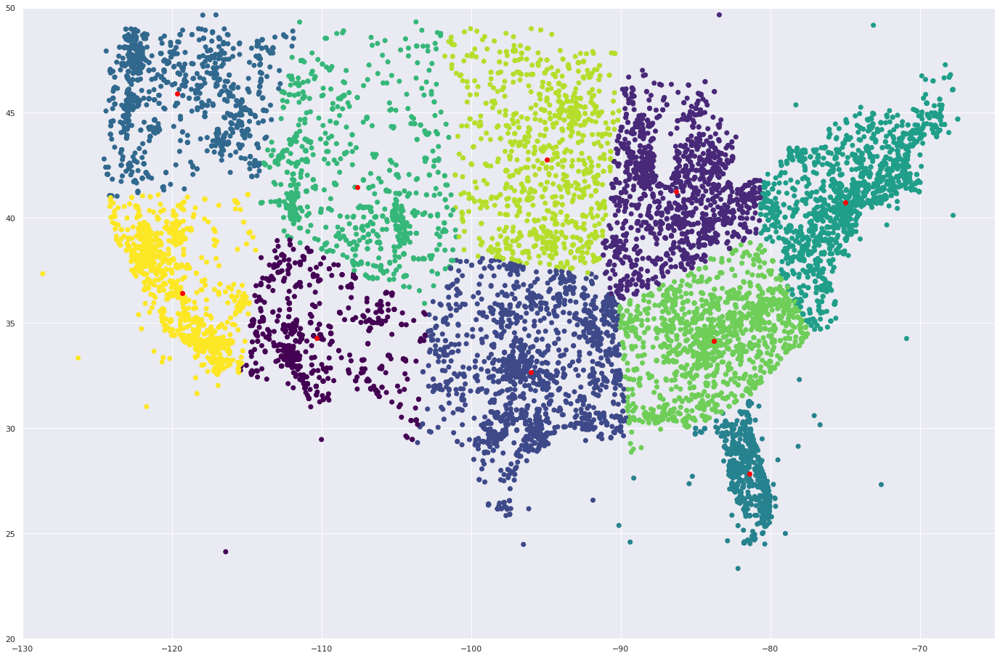

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters = 10).fit(aviation_map[["Longitude", "Latitude"]])
aviation_map["KMeans_Label"] = kmeans.labels_

f, axes = plt.subplots(1, 1, figsize=(24,16))
plt.scatter(x = aviation_map.Longitude, y = aviation_map.Latitude, c = aviation_map.KMeans_Label, cmap = 'viridis')
plt.xlim(-130, -65)
plt.ylim(20, 50)

# Plot the centre points of clusters
for centre in kmeans.cluster_centers_:
  plt.scatter(x = centre[0], y = centre[1], color="red")

In [ ]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Scattergeo(
        lat = aviation_map["Latitude"],
        lon = aviation_map["Longitude"],
        mode = 'markers',
        marker = dict(
            colorscale = "viridis",
            color = aviation_map["KMeans_Label"],
            opacity = 0.7,
            size = 3
        )
        ))

fig.update_layout(
    geo = dict(
        scope='usa',
        landcolor = "rgb(212, 212, 212)",
        lonaxis = dict(
            showgrid = True,
            gridwidth = 0.5,
            range= [ -130.0, -65.0 ],
            dtick = 5
        ),
        lataxis = dict (
            showgrid = True,
            gridwidth = 0.5,
            range= [ 20.0, 50.0 ],
            dtick = 5
        )
    ),
    title = "USA"
    )

fig.show()

Clustering of aviation accident location using DBSCAN

(20.0, 50.0)

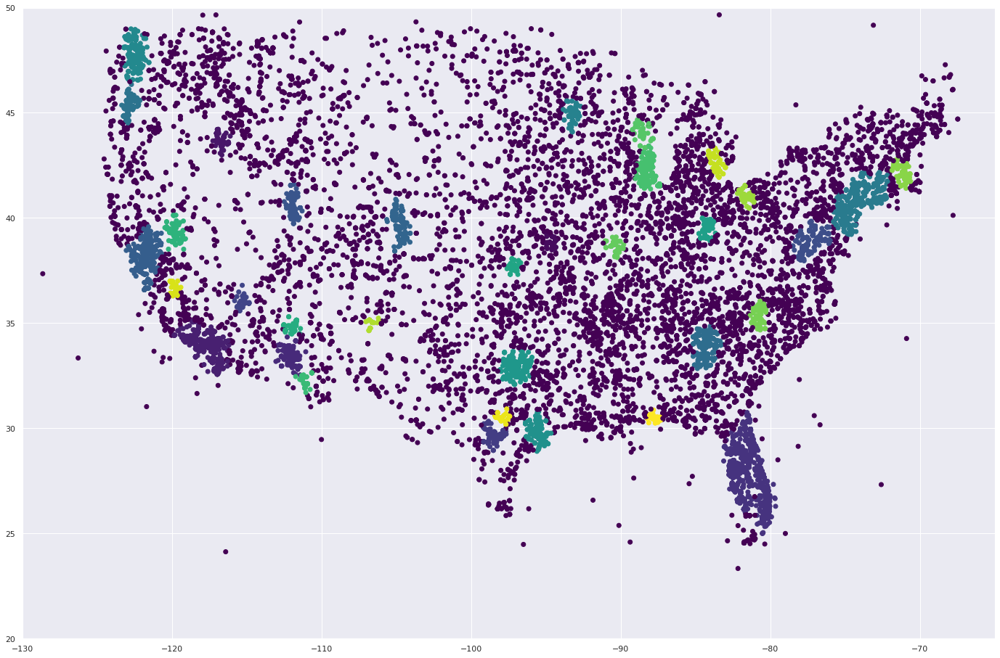

In [ ]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.45, min_samples=50).fit(aviation_map[["Longitude", "Latitude"]])
aviation_map["DBSCAN_Label"] = dbscan.labels_

f, axes = plt.subplots(1, 1, figsize=(24,16))
plt.scatter(x = aviation_map.Longitude, y = aviation_map.Latitude, c = aviation_map.DBSCAN_Label, cmap = 'viridis')
plt.xlim(-130, -65)
plt.ylim(20, 50)

In [ ]:
fig = go.Figure(data=go.Scattergeo(
        lat = aviation_map["Latitude"],
        lon = aviation_map["Longitude"],
        mode = 'markers',
        marker = dict(
            colorscale = "viridis",
            color = aviation_map["DBSCAN_Label"],
            opacity = 0.7,
            size = 3
        )
        ))

fig.update_layout(
    geo = dict(
        scope='usa',
        landcolor = "rgb(212, 212, 212)",
        lonaxis = dict(
            showgrid = True,
            gridwidth = 0.5,
            range= [ -130.0, -65.0 ],
            dtick = 5
        ),
        lataxis = dict (
            showgrid = True,
            gridwidth = 0.5,
            range= [ 20.0, 50.0 ],
            dtick = 5
        )
    ),
    title = "USA"
    )

fig.show()

Clustering of aviation accident location using OPTICS

(20.0, 50.0)

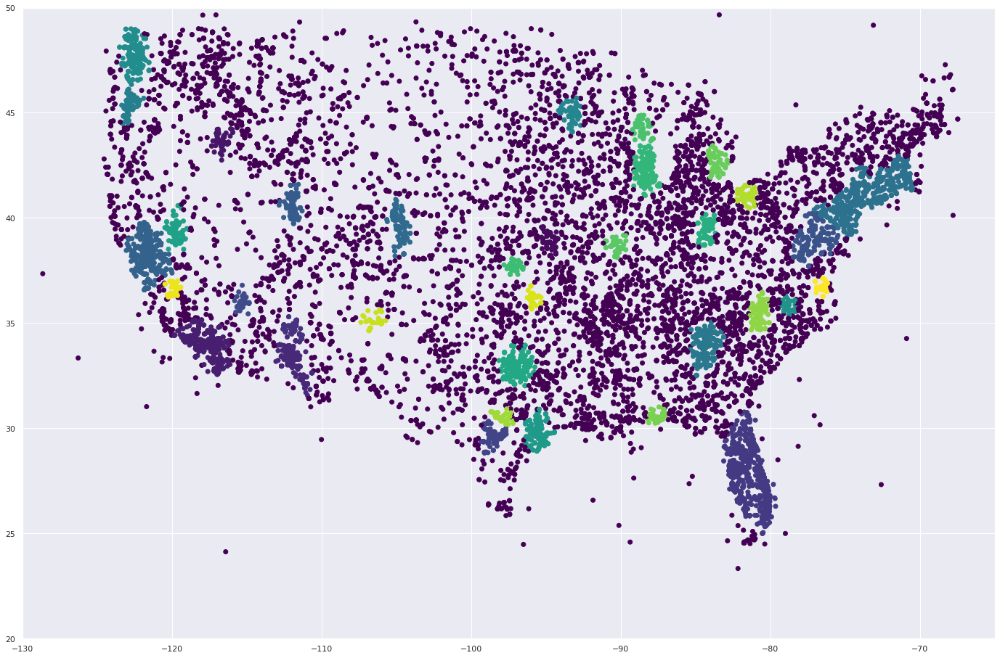

In [ ]:
from sklearn.cluster import OPTICS

optics = DBSCAN(min_samples=50).fit(aviation_map[["Longitude", "Latitude"]])
aviation_map["OPTICS_Label"] = optics.labels_

f, axes = plt.subplots(1, 1, figsize=(24,16))
plt.scatter(x = aviation_map.Longitude, y = aviation_map.Latitude, c = aviation_map.OPTICS_Label, cmap = 'viridis')
plt.xlim(-130, -65)
plt.ylim(20, 50)

In [ ]:
fig = go.Figure(data=go.Scattergeo(
        lat = aviation_map["Latitude"],
        lon = aviation_map["Longitude"],
        mode = 'markers',
        marker = dict(
            colorscale = "viridis",
            color = aviation_map["OPTICS_Label"],
            opacity = 0.7,
            size = 3
        )
        ))

fig.update_layout(
    geo = dict(
        scope='usa',
        landcolor = "rgb(212, 212, 212)",
        lonaxis = dict(
            showgrid = True,
            gridwidth = 0.5,
            range= [ -130.0, -65.0 ],
            dtick = 5
        ),
        lataxis = dict (
            showgrid = True,
            gridwidth = 0.5,
            range= [ 20.0, 50.0 ],
            dtick = 5
        )
    ),
    title = "USA"
    )

fig.show()

Density map showing the location of the avaition accident (airplane) in the United States

In [ ]:
import pandas as pd

import plotly.graph_objects as go
fig = go.Figure(go.Densitymapbox(lat=aviation_map.Latitude, 
                                 lon=aviation_map.Longitude, 
                                 radius=5)
)
fig.update_layout(mapbox_style="stamen-terrain", 
                  mapbox_center_lon=-95, 
                  mapbox_center_lat=38, 
                  geo_scope="usa", 
                  title="USA",
                  margin={"r":0,"t":0,"l":0,"b":0},
                  mapbox_zoom = 3.5
                  )
fig.show()

Accident and incident by the phase of flight

In [ ]:
accident_aviation = df[df["Investigation.Type"] == "Accident"]
accident_phase = pd.DataFrame(accident_aviation["Broad.Phase.of.Flight"].value_counts())
accident_phase

,Broad.Phase.of.Flight
LANDING,6670
TAKEOFF,4288
APPROACH,1887
MANEUVERING,1842
CRUISE,1334
TAXI,648
DESCENT,505
GO-AROUND,455
CLIMB,387
STANDING,299


In [ ]:
incident_aviation = df[df["Investigation.Type"] == "Incident"]
incident_phase = pd.DataFrame(incident_aviation["Broad.Phase.of.Flight"].value_counts())
incident_phase

,Broad.Phase.of.Flight
TAKEOFF,116
LANDING,115
APPROACH,66
TAXI,43
CLIMB,39
CRUISE,39
DESCENT,21
STANDING,17
MANEUVERING,14
GO-AROUND,12


In [ ]:
accident_incident_phase = pd.concat([accident_phase, incident_phase], axis=1).reindex(accident_phase.index)
accident_incident_phase.columns = ["Accident", "Incident"]
accident_incident_phase["Percentage"] = round(accident_incident_phase["Accident"] * 100 / (accident_incident_phase["Accident"] + accident_incident_phase["Incident"]), 2)
accident_incident_phase

,Accident,Incident,Percentage
LANDING,6670,115,98.31
TAKEOFF,4288,116,97.37
APPROACH,1887,66,96.62
MANEUVERING,1842,14,99.25
CRUISE,1334,39,97.16
TAXI,648,43,93.78
DESCENT,505,21,96.01
GO-AROUND,455,12,97.43
CLIMB,387,39,90.85
STANDING,299,17,94.62


Countplot showing accident and incident of each phase of flight

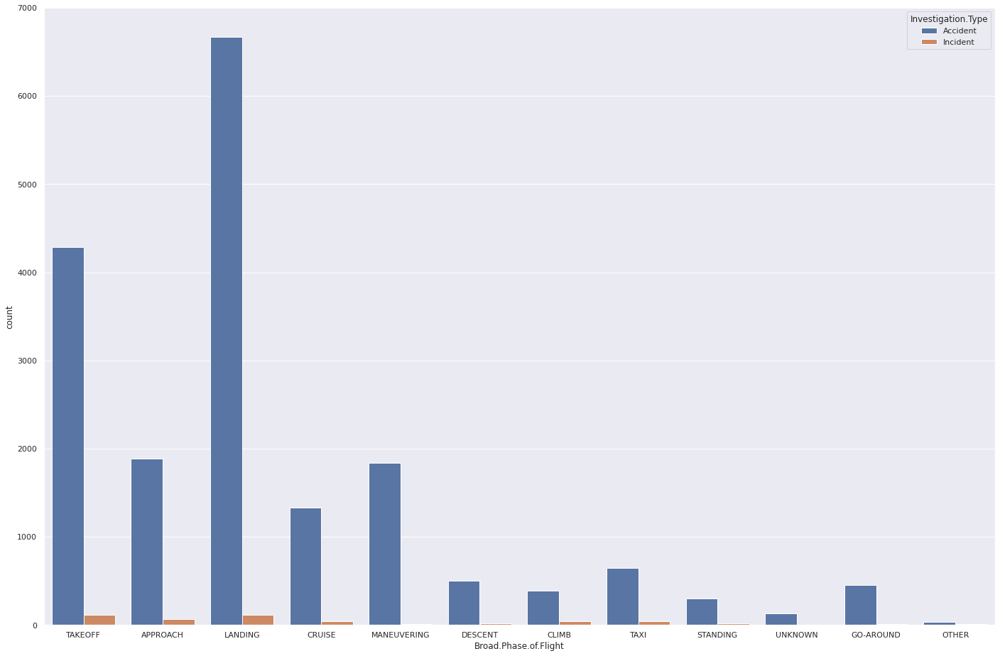

In [ ]:
plt.figure(figsize=(24, 16))
sns.countplot(x="Broad.Phase.of.Flight", hue="Investigation.Type", data=df)

Aviation accident and incident by the weather conditions

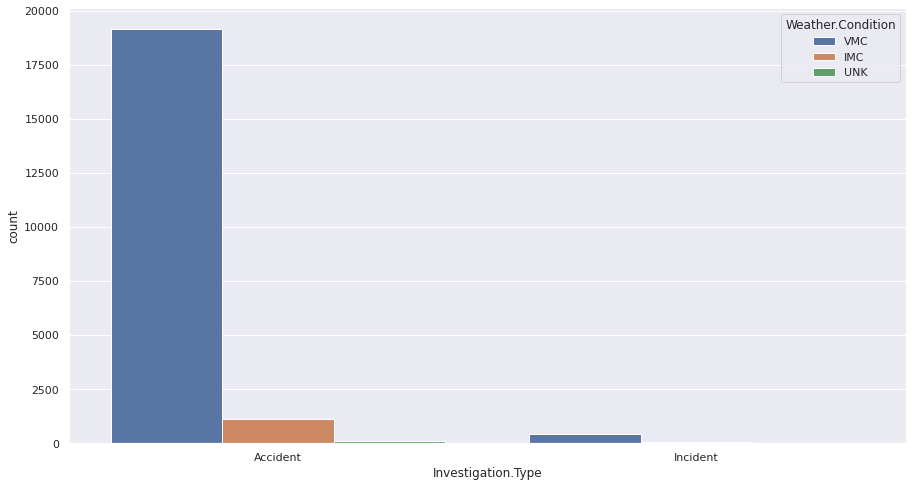

In [ ]:
accident_weather_aviation_df = df[["Investigation.Type", "Weather.Condition"]].dropna(axis=0)
accident_weather_aviation_df = accident_weather_aviation_df.reset_index()
accident_weather_aviation_df = accident_weather_aviation_df[["Investigation.Type", "Weather.Condition"]]
accident_weather_aviation_df.head()

plt.figure(figsize=(15,8))
ax = sns.countplot(hue="Weather.Condition", x="Investigation.Type", data=accident_weather_aviation_df)

In [ ]:
accident_weather = accident_weather_aviation_df[accident_weather_aviation_df["Investigation.Type"] == "Accident"].groupby("Weather.Condition").count()

In [ ]:
incident_weather = accident_weather_aviation_df[accident_weather_aviation_df["Investigation.Type"] == "Incident"].groupby("Weather.Condition").count()

In [ ]:
accident_weather = accident_weather.reset_index()
accident_weather = accident_weather.rename(columns = {"Investigation.Type": "Accident"})
incident_weather = incident_weather.reset_index()
incident_weather = incident_weather.rename(columns = {"Investigation.Type": "Incident"})


accident_incident_weather = pd.concat([accident_weather, incident_weather["Incident"]], axis=1)

In [ ]:
accident_incident_weather = accident_incident_weather.groupby("Weather.Condition").sum()

Heatmap showing aviation accident and incident at each weather condition

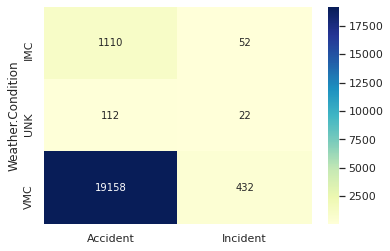

In [ ]:
sns.heatmap(accident_incident_weather,  annot=True, fmt="d", cmap="YlGnBu")

Prediction



Select the data columns for predicting whether the data is an accident or incident

In [ ]:
selectedPredictors_Categorical =  ["Amateur.Built", "Aircraft.Damage", "Engine.Type", "Weather.Condition", "Broad.Phase.of.Flight"]
selectedPredictors_Numeric = ["Number.of.Engines"]

aviation_predict = df[["Investigation.Type"] + selectedPredictors_Categorical + selectedPredictors_Numeric]

Data cleaning to clean NaN row by deleting them then reseting the index

In [ ]:
aviation_predict.isnull().sum()

Investigation.Type          2
Amateur.Built              67
Aircraft.Damage           465
Engine.Type               486
Weather.Condition         316
Broad.Phase.of.Flight    2227
Number.of.Engines         584
dtype: int64

In [ ]:
aviation_predict = aviation_predict.dropna(axis=0)
aviation_predict = aviation_predict.reset_index(drop=True)
aviation_predict.head()

,Investigation.Type,Amateur.Built,Aircraft.Damage,Engine.Type,Weather.Condition,Broad.Phase.of.Flight,Number.of.Engines
0,Accident,No,Substantial,Reciprocating,VMC,TAKEOFF,1.0
1,Accident,No,Destroyed,Reciprocating,VMC,TAKEOFF,1.0
2,Accident,No,Destroyed,Turbo Prop,IMC,TAKEOFF,2.0
3,Accident,No,Substantial,Reciprocating,VMC,LANDING,1.0
4,Accident,No,Substantial,Reciprocating,VMC,CRUISE,1.0


Use dummy variable encoding for categorical variables to enable machine learning to perform the prediction on the categorical varible

In [ ]:
aviation_predict_dummies = pd.get_dummies(aviation_predict, columns = ["Investigation.Type"])
aviation_predict_dummies = aviation_predict_dummies.drop(["Investigation.Type_Incident"], axis=1)
aviation_predict_dummies = pd.get_dummies(aviation_predict_dummies, columns = selectedPredictors_Categorical, drop_first=True)
aviation_predict_dummies.head()

,Number.of.Engines,Investigation.Type_Accident,Amateur.Built_Yes,Aircraft.Damage_Minor,Aircraft.Damage_Substantial,"Engine.Type_REC, TJ, TJ",Engine.Type_Reciprocating,"Engine.Type_TJ, REC, REC, TJ",Engine.Type_Turbo Fan,Engine.Type_Turbo Jet,Engine.Type_Turbo Prop,Engine.Type_Turbo Shaft,Engine.Type_Unknown,Weather.Condition_UNK,Weather.Condition_VMC,Broad.Phase.of.Flight_CLIMB,Broad.Phase.of.Flight_CRUISE,Broad.Phase.of.Flight_DESCENT,Broad.Phase.of.Flight_GO-AROUND,Broad.Phase.of.Flight_LANDING,Broad.Phase.of.Flight_MANEUVERING,Broad.Phase.of.Flight_OTHER,Broad.Phase.of.Flight_STANDING,Broad.Phase.of.Flight_TAKEOFF,Broad.Phase.of.Flight_TAXI,Broad.Phase.of.Flight_UNKNOWN
0,1.0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
1,1.0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
2,2.0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,1.0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
4,1.0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0


Basic Statistical Analysis related to the data

In [ ]:
# correlation analysis
aviation_predict_dummies.corr()

,Number.of.Engines,Investigation.Type_Accident,Amateur.Built_Yes,Aircraft.Damage_Minor,Aircraft.Damage_Substantial,"Engine.Type_REC, TJ, TJ",Engine.Type_Reciprocating,"Engine.Type_TJ, REC, REC, TJ",Engine.Type_Turbo Fan,Engine.Type_Turbo Jet,Engine.Type_Turbo Prop,Engine.Type_Turbo Shaft,Engine.Type_Unknown,Weather.Condition_UNK,Weather.Condition_VMC,Broad.Phase.of.Flight_CLIMB,Broad.Phase.of.Flight_CRUISE,Broad.Phase.of.Flight_DESCENT,Broad.Phase.of.Flight_GO-AROUND,Broad.Phase.of.Flight_LANDING,Broad.Phase.of.Flight_MANEUVERING,Broad.Phase.of.Flight_OTHER,Broad.Phase.of.Flight_STANDING,Broad.Phase.of.Flight_TAKEOFF,Broad.Phase.of.Flight_TAXI,Broad.Phase.of.Flight_UNKNOWN
Number.of.Engines,1.000000,-0.225293,-0.116504,0.227695,-0.166818,0.088613,-0.395671,0.062657,0.412917,0.139417,0.170801,0.001424,-0.005316,0.038376,-0.168968,0.036527,0.001411,0.025499,-0.002545,-0.029807,-0.063061,0.014223,0.057444,-0.026264,0.074354,-0.007075
Investigation.Type_Accident,-0.225293,1.000000,0.036259,-0.823459,0.311046,0.001317,0.222596,0.000931,-0.273072,-0.071700,-0.074375,-0.020510,-0.010906,-0.058469,0.036834,-0.039166,-0.005831,-0.006009,0.011103,0.017989,0.027528,-0.025333,-0.019046,0.010458,-0.047174,0.004262
Amateur.Built_Yes,-0.116504,0.036259,1.000000,-0.033435,0.010206,-0.003996,0.090038,-0.002826,-0.053615,-0.018530,-0.068271,-0.007477,-0.000715,-0.014347,0.066752,-0.001921,-0.003957,-0.011441,-0.009372,-0.049330,0.025068,-0.005290,-0.027585,0.055656,-0.032596,0.003624
Aircraft.Damage_Minor,0.227695,-0.823459,-0.033435,1.000000,-0.378475,-0.001575,-0.228771,-0.001114,0.283966,0.083246,0.072224,0.016383,0.007813,0.045916,-0.026514,0.031873,0.000016,0.007685,-0.016392,-0.042565,-0.027549,0.019359,0.080933,-0.026782,0.138470,-0.007125
Aircraft.Damage_Substantial,-0.166818,0.311046,0.010206,-0.378475,1.000000,-0.011306,0.131643,-0.018931,-0.114654,-0.053912,-0.069422,-0.000482,0.001524,-0.061629,0.222901,-0.067562,-0.115336,-0.038755,-0.011844,0.226526,-0.134860,-0.034386,-0.009595,-0.003228,-0.005562,-0.058908
"Engine.Type_REC, TJ, TJ",0.088613,0.001317,-0.003996,-0.001575,-0.011306,1.000000,-0.035596,-0.000079,-0.001495,-0.000774,-0.002526,-0.000208,-0.000325,-0.000782,-0.019928,-0.001536,-0.002931,-0.001697,-0.001681,-0.008050,0.031936,-0.000467,-0.001280,-0.005798,-0.002025,-0.000844
Engine.Type_Reciprocating,-0.395671,0.222596,0.090038,-0.228771,0.131643,-0.035596,1.000000,-0.025170,-0.477600,-0.247266,-0.806836,-0.066604,-0.103823,-0.030727,0.102703,-0.047244,0.030813,-0.008433,0.018276,0.064241,-0.066592,-0.019324,-0.064976,0.019499,-0.073474,0.010844
"Engine.Type_TJ, REC, REC, TJ",0.062657,0.000931,-0.002826,-0.001114,-0.018931,-0.000079,-0.025170,1.000000,-0.001057,-0.000547,-0.001786,-0.000147,-0.000230,-0.000553,0.001855,-0.001086,-0.002073,-0.001200,-0.001189,-0.005692,-0.002467,-0.000330,-0.000905,0.013590,-0.001432,-0.000597
Engine.Type_Turbo Fan,0.412917,-0.273072,-0.053615,0.283966,-0.114654,-0.001495,-0.477600,-0.001057,1.000000,-0.010385,-0.033887,-0.002797,-0.004361,0.060292,-0.064235,0.027277,-0.023764,-0.007397,-0.009638,-0.015648,-0.038734,0.002835,0.097009,-0.020734,0.115969,-0.006272
Engine.Type_Turbo Jet,0.139417,-0.071700,-0.018530,0.083246,-0.053912,-0.000774,-0.247266,-0.000547,-0.010385,1.000000,-0.017544,-0.001448,-0.002258,0.004933,-0.037259,0.010780,-0.008509,0.012592,-0.006759,-0.011566,-0.001166,-0.003241,0.016683,-0.016739,0.023093,-0.005862


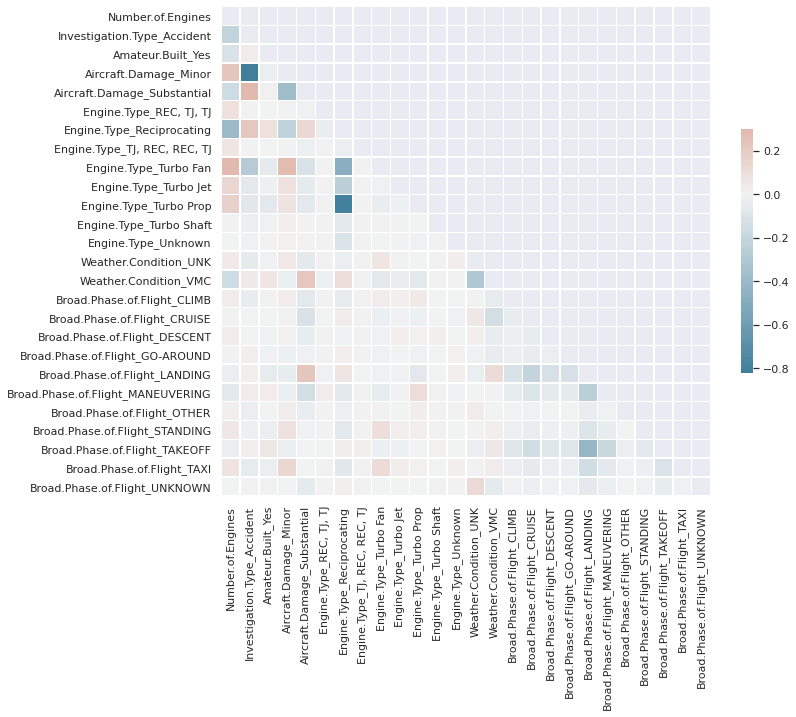

In [ ]:
corr = aviation_predict_dummies.corr()

# Generate a upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [ ]:
import plotly.offline as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly import tools
from plotly.subplots import make_subplots

fig = make_subplots(1,1)
# Heatmap of the Correlation Matrix
trace = go.Heatmap(z = aviation_predict_dummies.corr(), 
                   x = aviation_predict_dummies.columns, 
                   y = aviation_predict_dummies.columns, 
                   colorscale='RdBu',
    zmid=0)
#fig.update_layout(coloraxis = {'colorscale':'viridis'})
data=[trace]
py.iplot(data, filename='labelled-heatmap')

Select the predictors and the data which will be predicted

In [ ]:
X = aviation_predict_dummies[[list(aviation_predict_dummies.columns)[0]] + list(aviation_predict_dummies.columns)[2:]]
y = aviation_predict_dummies[["Investigation.Type_Accident"]]

Split the train and test data

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

Gradient Boosted Trees Classifier Prediction

/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/_gb.py:1454: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9964186231595702

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9957296695135537

Test Data Prediction

False Positive Rate :  0.1304
False Negative Rate :  0.0026


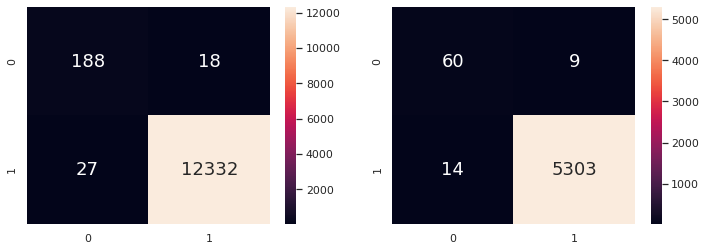

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix

clf = GradientBoostingClassifier(max_depth=4)
clf.fit(X_train, y_train)

y_train_pred = clf.predict(X_train)
y_test_pred = clf.predict(X_test)

print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", clf.score(X_train, y_train))
print()

print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", clf.score(X_test, y_test))
print()

f, axes = plt.subplots(1, 2, figsize=(12, 4))
sns.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sns.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

cfm=confusion_matrix(y_test, y_test_pred)

print("Test Data Prediction")

fp_test = cfm[0][1]
fn_test = cfm[1][0]
tp_test = cfm[1][1]
tn_test = cfm[0][0]

print()
print("False Positive Rate : ", round(fp_test / (fp_test + tn_test),4))
print("False Negative Rate : ", round(fn_test / (fn_test + tp_test),4))

Plot one of the 100 graphs of the Gradient Boosted Trees Classifier Prediction

In [ ]:
import graphviz
from sklearn.tree import export_graphviz

treeNumber = 0

sub_tree = clf.estimators_[treeNumber - 1, 0]

treedot = export_graphviz(sub_tree,                                     # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = 'tree.dot',                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)

from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename = 'tree.png')

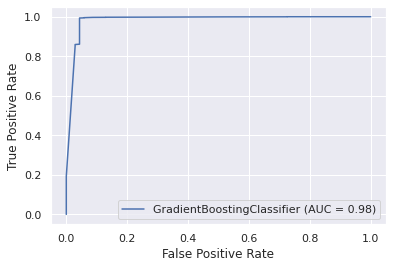

In [ ]:
from sklearn.metrics import plot_roc_curve
clf_disp = plot_roc_curve(clf, X_test, y_test)

Extra Trees Classifier Prediction

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9910067648229208

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9923876717415522

Test Data Prediction

False Positive Rate :  0.5217
False Negative Rate :  0.0009


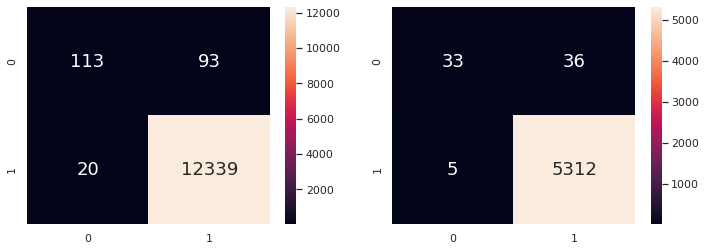

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import confusion_matrix

etc = ExtraTreesClassifier(max_depth=4)
etc.fit(X_train, y_train)

y_train_pred = etc.predict(X_train)
y_test_pred = etc.predict(X_test)

print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", etc.score(X_train, y_train))
print()

print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", etc.score(X_test, y_test))
print()

f, axes = plt.subplots(1, 2, figsize=(12, 4))
sns.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sns.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

cfm=confusion_matrix(y_test, y_test_pred)

print("Test Data Prediction")

fp_test = cfm[0][1]
fn_test = cfm[1][0]
tp_test = cfm[1][1]
tn_test = cfm[0][0]

print()
print("False Positive Rate : ", round(fp_test / (fp_test + tn_test),4))
print("False Negative Rate : ", round(fn_test / (fn_test + tp_test),4))

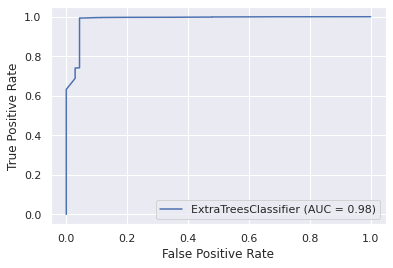

In [ ]:
from sklearn.metrics import plot_roc_curve
etc_disp = plot_roc_curve(etc, X_test, y_test)

Decision Tree Classifier Prediction

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9949860724233983

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9951726698848867



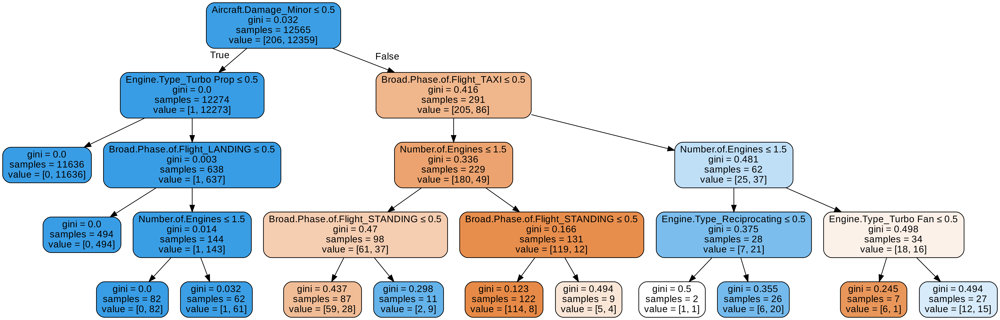

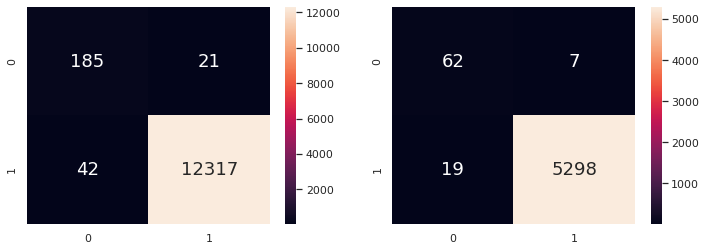

In [ ]:
# Import essential models and functions from sklearn
from sklearn.tree import DecisionTreeClassifier
import graphviz

dectree = DecisionTreeClassifier(max_depth = 4)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

f, axes = plt.subplots(1, 2, figsize=(12, 4))
sns.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sns.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = 'tree.dot',                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)

from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename = 'tree.png')

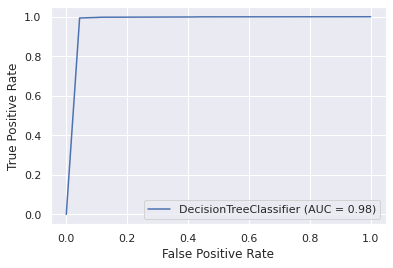

In [ ]:
from sklearn.metrics import plot_roc_curve
dectree_disp = plot_roc_curve(dectree, X_test, y_test)

Gaussian Naive Bayes Prediction

/usr/local/lib/python3.6/dist-packages/sklearn/naive_bayes.py:206: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9875049741345006

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9894170070553286

Test Data Prediction

False Positive Rate :  0.058
False Negative Rate :  0.01


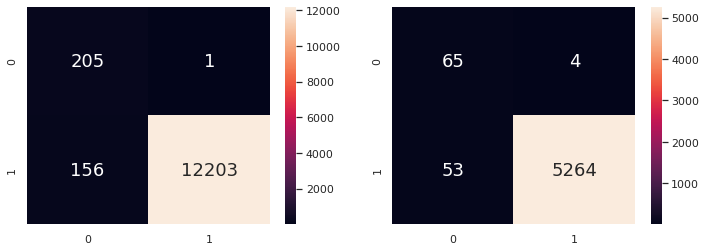

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()
gnb.fit(X_train, y_train)

y_train_pred = gnb.predict(X_train)
y_test_pred = gnb.predict(X_test)

print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", gnb.score(X_train, y_train))
print()

print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", gnb.score(X_test, y_test))
print()

f, axes = plt.subplots(1, 2, figsize=(12, 4))
sns.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sns.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

cfm=confusion_matrix(y_test, y_test_pred)

print("Test Data Prediction")

fp_test = cfm[0][1]
fn_test = cfm[1][0]
tp_test = cfm[1][1]
tn_test = cfm[0][0]

print()
print("False Positive Rate : ", round(fp_test / (fp_test + tn_test),4))
print("False Negative Rate : ", round(fn_test / (fn_test + tp_test),4))

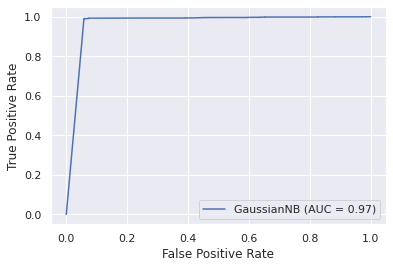

In [ ]:
from sklearn.metrics import plot_roc_curve
gnb_disp = plot_roc_curve(gnb, X_test, y_test)

Multinomial Naive Bayes Prediction

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9907680063668921

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9903453397697735

Test Data Prediction

False Positive Rate :  0.2899
False Negative Rate :  0.006


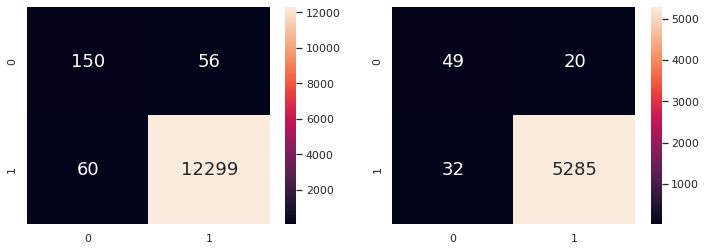

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB

mnb = MultinomialNB()
mnb.fit(X_train, y_train)

y_train_pred = mnb.predict(X_train)
y_test_pred = mnb.predict(X_test)

print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", mnb.score(X_train, y_train))
print()

print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", mnb.score(X_test, y_test))
print()

f, axes = plt.subplots(1, 2, figsize=(12, 4))
sns.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sns.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

cfm=confusion_matrix(y_test, y_test_pred)

print("Test Data Prediction")

fp_test = cfm[0][1]
fn_test = cfm[1][0]
tp_test = cfm[1][1]
tn_test = cfm[0][0]

print()
print("False Positive Rate : ", round(fp_test / (fp_test + tn_test),4))
print("False Negative Rate : ", round(fn_test / (fn_test + tp_test),4))

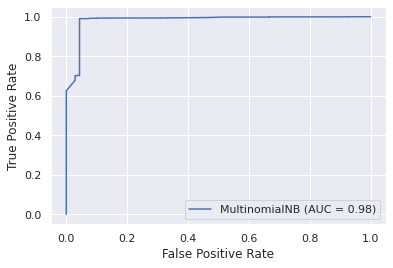

In [ ]:
from sklearn.metrics import plot_roc_curve
mnb_disp = plot_roc_curve(mnb, X_test, y_test)

Complement Naive Bayes Prediction

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.973975328292877

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9749350167099888

Test Data Prediction

False Positive Rate :  0.0435
False Negative Rate :  0.0248


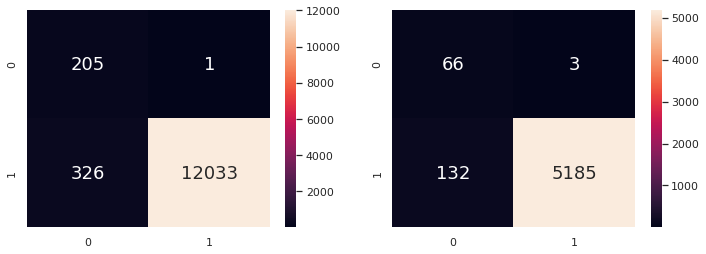

In [ ]:
from sklearn.naive_bayes import ComplementNB

cnb = ComplementNB()
cnb.fit(X_train, y_train)

y_train_pred = cnb.predict(X_train)
y_test_pred = cnb.predict(X_test)

print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", cnb.score(X_train, y_train))
print()

print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", cnb.score(X_test, y_test))
print()

f, axes = plt.subplots(1, 2, figsize=(12, 4))
sns.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sns.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

cfm=confusion_matrix(y_test, y_test_pred)

print("Test Data Prediction")

fp_test = cfm[0][1]
fn_test = cfm[1][0]
tp_test = cfm[1][1]
tn_test = cfm[0][0]

print()
print("False Positive Rate : ", round(fp_test / (fp_test + tn_test),4))
print("False Negative Rate : ", round(fn_test / (fn_test + tp_test),4))

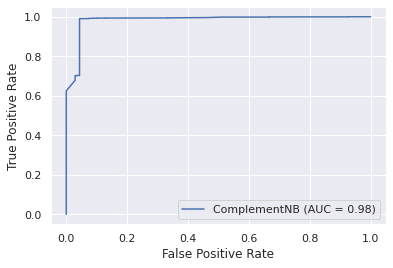

In [ ]:
from sklearn.metrics import plot_roc_curve
cnb_disp = plot_roc_curve(cnb, X_test, y_test)

Support Vector Machine Prediction

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.996100278551532

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9948013367991088

Test Data Prediction

False Positive Rate :  0.1884
False Negative Rate :  0.0028


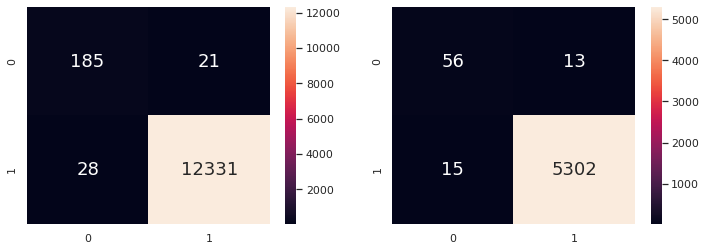

In [ ]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC

svm = make_pipeline(StandardScaler(), SVC(gamma='auto'))
svm.fit(X_train, y_train)

y_train_pred = svm.predict(X_train)
y_test_pred = svm.predict(X_test)

print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", svm.score(X_train, y_train))
print()

print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", svm.score(X_test, y_test))
print()

f, axes = plt.subplots(1, 2, figsize=(12, 4))
sns.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sns.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

cfm=confusion_matrix(y_test, y_test_pred)

print("Test Data Prediction")

fp_test = cfm[0][1]
fn_test = cfm[1][0]
tp_test = cfm[1][1]
tn_test = cfm[0][0]

print()
print("False Positive Rate : ", round(fp_test / (fp_test + tn_test),4))
print("False Negative Rate : ", round(fn_test / (fn_test + tp_test),4))

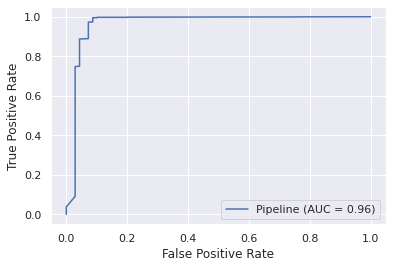

In [ ]:
from sklearn.metrics import plot_roc_curve
svm_disp = plot_roc_curve(svm, X_test, y_test)

Random Forest Classifier Prediction

In [ ]:
# Model (can also use single decision tree)
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=10, max_depth=5)

# Train
rfc.fit(X, y)
# Extract single tree
estimator = rfc.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = X.columns,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename = 'tree.png')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



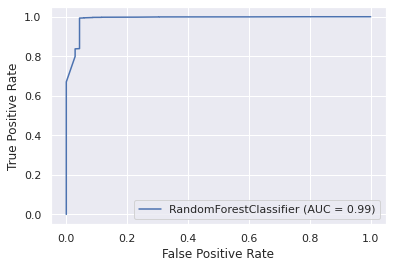

In [ ]:
from sklearn.metrics import plot_roc_curve
rfc_disp = plot_roc_curve(rfc, X_test, y_test)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9937126939912455

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9949870033419977

Test Data Prediction

False Positive Rate :  0.3043
False Negative Rate :  0.0011


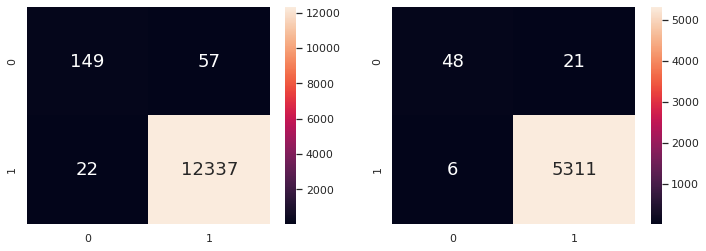

In [ ]:
# Predict Legendary values corresponding to Total
y_train_pred = rfc.predict(X_train)
y_test_pred = rfc.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", rfc.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", rfc.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sns.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sns.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

cfm=confusion_matrix(y_test, y_test_pred)

print("Test Data Prediction")

fp_test = cfm[0][1]
fn_test = cfm[1][0]
tp_test = cfm[1][1]
tn_test = cfm[0][0]

print()
print("False Positive Rate : ", round(fp_test / (fp_test + tn_test),4))
print("False Negative Rate : ", round(fn_test / (fn_test + tp_test),4))

Linear Regression Prediction of Probabity

Intercept of Regression 	: b =  [1.02746271]
Coefficients of Regression 	: a =  [[-1.18653956e-02  3.83065541e-03 -7.01208808e-01 -3.12127146e-03
   1.96940701e-02 -1.13847229e-02  2.17979685e-02 -4.32870809e-02
   8.86751058e-04 -2.19256434e-02 -5.27696104e-02 -3.59838643e-02
  -2.40312381e-02 -4.08613306e-04 -6.88739368e-03 -3.25902660e-03
   1.64368236e-03 -8.90310802e-04 -2.33688986e-03  2.06974504e-03
  -1.95548022e-02  4.42534707e-02 -1.39048243e-03  4.70446921e-02
   7.22778883e-04]]



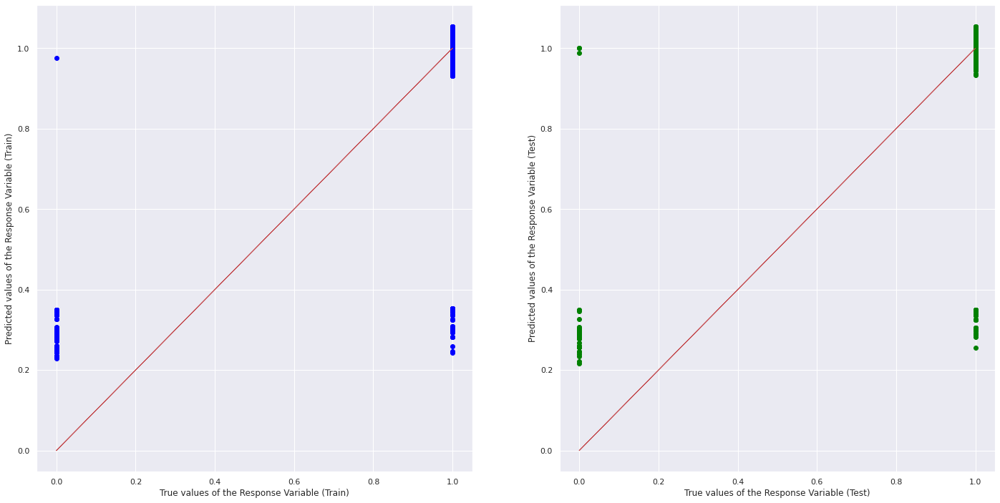

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.7058468615089082
Mean Squared Error (MSE) 	: 0.004743501620013329

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.6379668084062122
Mean Squared Error (MSE) 	: 0.004578586694265038



In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

linreg = LinearRegression()        
linreg.fit(X_train, y_train)    

print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'r', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'r', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

# Goodness of Fit -- Train 
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Goodness of Fit -- Test
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

Logistic Regression Prediction

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9937126939912455

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9949870033419977

Test Data Prediction

False Positive Rate :  0.3043
False Negative Rate :  0.0011


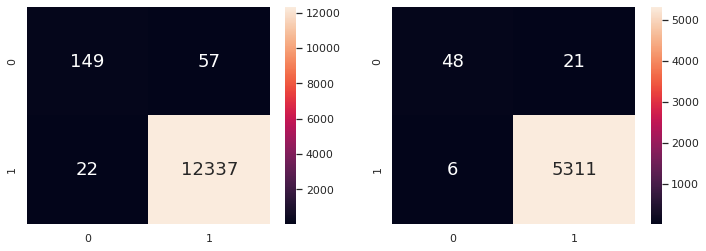

In [ ]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression()
logreg.fit(X_train, y_train)

y_train_pred = logreg.predict(X_train)
y_test_pred = logreg.predict(X_test)

# Predict Legendary values corresponding to Total
y_train_pred = rfc.predict(X_train)
y_test_pred = rfc.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", rfc.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", rfc.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sns.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sns.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

cfm_train = confusion_matrix(y_train, y_train_pred)
cfm_test = confusion_matrix(y_test, y_test_pred)

print("Test Data Prediction")

fp_test = cfm_test[0][1]
fn_test = cfm_test[1][0]
tp_test = cfm_test[1][1]
tn_test = cfm_test[0][0]

print()
print("False Positive Rate : ", round(fp_test / (fp_test + tn_test),4))
print("False Negative Rate : ", round(fn_test / (fn_test + tp_test),4))

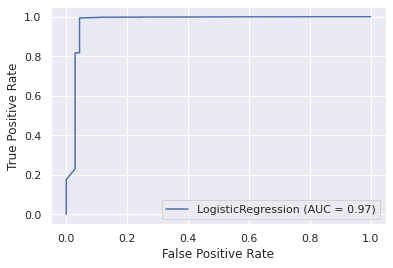

In [ ]:
from sklearn.metrics import plot_roc_curve
logreg_disp = plot_roc_curve(logreg, X_test, y_test)

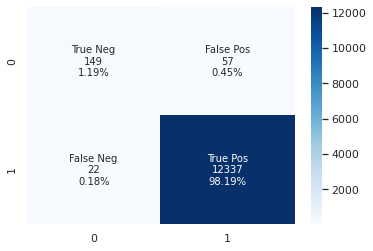

In [ ]:
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ['{0:0.0f}'.format(value) for value in
                cfm_train.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in
                     cfm_train.flatten()/np.sum(cfm_train)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cfm_train, annot=labels, fmt='', cmap='Blues')

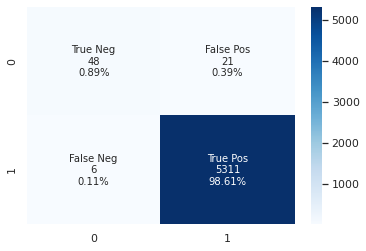

In [ ]:
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ['{0:0.0f}'.format(value) for value in
                cfm_test.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in
                     cfm_test.flatten()/np.sum(cfm_test)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cfm_test, annot=labels, fmt='', cmap='Blues')

Detailed statistical summary of the selected data

In [ ]:
import statsmodels.api as sm

X_train_sm = sm.add_constant(X_train)
logm2 = sm.GLM(y_train, X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.

/usr/local/lib/python3.6/dist-packages/statsmodels/genmod/families/family.py:890: RuntimeWarning:

invalid value encountered in true_divide

/usr/local/lib/python3.6/dist-packages/statsmodels/genmod/families/family.py:942: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/statsmodels/genmod/families/family.py:943: RuntimeWarning:

divide by zero encountered in log

/usr/local/lib/python3.6/dist-packages/statsmodels/genmod/families/family.py:943: RuntimeWarning:

invalid value encountered in add



<class 'statsmodels.iolib.summary.Summary'>
"""
                      Generalized Linear Model Regression Results                      
=======================================================================================
Dep. Variable:     Investigation.Type_Accident   No. Observations:                12565
Model:                                     GLM   Df Residuals:                    12539
Model Family:                         Binomial   Df Model:                           25
Link Function:                           logit   Scale:                          1.0000
Method:                                   IRLS   Log-Likelihood:                    nan
Date:                         Sun, 01 Nov 2020   Deviance:                          nan
Time:                                 11:12:53   Pearson chi2:                 1.51e+03
No. Iterations:                            100                                         
Covariance Type:                     nonrobust                                         
=====================================================================================================
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const                                78.3956   3.88e+07   2.02e-06      1.000    -7.6e+07     7.6e+07
Number.of.Engines                    -0.7778      0.399     -1.949      0.051      -1.560       0.004
Amateur.Built_Yes                     1.6140      0.695      2.322      0.020       0.251       2.977
Aircraft.Damage_Minor               -41.0982    1.8e+06  -2.28e-05      1.000   -3.53e+06    3.53e+06
Aircraft.Damage_Substantial         -30.0424    1.8e+06  -1.67e-05      1.000   -3.53e+06    3.53e+06
Engine.Type_REC, TJ, TJ              -9.5853   6.13e+07  -1.56e-07      1.000    -1.2e+08     1.2e+08
Engine.Type_Reciprocating           -37.7133   3.87e+07  -9.73e-07      1.000   -7.59e+07    7.59e+07
Engine.Type_TJ, REC, REC, TJ        -37.9643   7.75e+07   -4.9e-07      1.000   -1.52e+08    1.52e+08
Engine.Type_Turbo Fan               -38.0177   3.87e+07  -9.81e-07      1.000   -7.59e+07    7.59e+07
Engine.Type_Turbo Jet               -36.9920   3.87e+07  -9.55e-07      1.000   -7.59e+07    7.59e+07
Engine.Type_Turbo Prop              -38.8748   3.87e+07     -1e-06      1.000   -7.59e+07    7.59e+07
Engine.Type_Turbo Shaft             -41.2083   3.87e+07  -1.06e-06      1.000   -7.59e+07    7.59e+07
Engine.Type_Unknown                 -39.9070   3.87e+07  -1.03e-06      1.000   -7.59e+07    7.59e+07
Weather.Condition_UNK                -2.2048      3.304     -0.667      0.505      -8.681       4.271
Weather.Condition_VMC                 0.6580      0.741      0.888      0.374      -0.794       2.110
Broad.Phase.of.Flight_CLIMB          -1.2014      1.123     -1.070      0.285      -3.403       1.000
Broad.Phase.of.Flight_CRUISE         -0.5296      0.772     -0.686      0.493      -2.042       0.983
Broad.Phase.of.Flight_DESCENT         0.8263      0.906      0.912      0.362      -0.950       2.602
Broad.Phase.of.Flight_GO-AROUND      -2.1001      2.870     -0.732      0.464      -7.725       3.525
Broad.Phase.of.Flight_LANDING        -1.4590      0.627     -2.327      0.020      -2.688      -0.230
Broad.Phase.of.Flight_MANEUVERING     0.6177      0.730      0.847      0.397      -0.812       2.048
Broad.Phase.of.Flight_OTHER          -2.9442      5.333     -0.552      0.581     -13.397       7.509
Broad.Phase.of.Flight_STANDING        1.8596      0.667      2.786      0.005       0.552       3.168
Broad.Phase.of.Flight_TAKEOFF        -0.4120      0.614     -0.671      0.502      -1.615       0.791
Broad.Phase.of.Flight_TAXI            1.6048      0.533      3.011      0.003       0.560       2.650
Broad.Phase.of.Flight_UNKNOWN        29.9980   7.45e+06   4.02e-06      1.000   -1.46e+07    1.46e+07
==========================

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Make a VIF dataframe for all the variables present

vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,Engine.Type_Reciprocating,46.93
13,Weather.Condition_VMC,20.32
0,Number.of.Engines,16.29
3,Aircraft.Damage_Substantial,10.05
18,Broad.Phase.of.Flight_LANDING,4.71
9,Engine.Type_Turbo Prop,4.12
22,Broad.Phase.of.Flight_TAKEOFF,3.30
7,Engine.Type_Turbo Fan,2.92
19,Broad.Phase.of.Flight_MANEUVERING,2.01
15,Broad.Phase.of.Flight_CRUISE,1.70


Conclusion

By compraing all the positive and negative error rates, Gaussian Naive Bayes is probably the best machine learning technique to predict the accident and incident in aviation.